Task 1.2.

В качестве образца звука была выбрана аудиозапись игры на гитаре.

In [5]:
from thinkdsp import read_wave

filename = "721608__gamer500__guitar-sample.wav"

wave = read_wave(filename)
wave.make_audio()

И для изучения взят небольшой фрагмент:

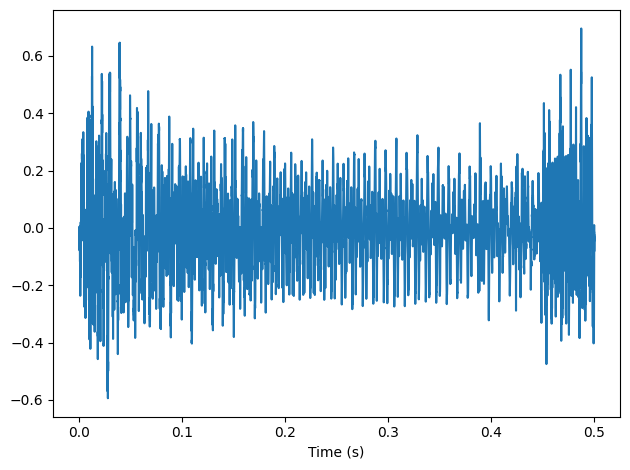

In [6]:
from thinkdsp import decorate

segment = wave.segment(0, 0.5)
segment.plot()
decorate(xlabel='Time (s)')

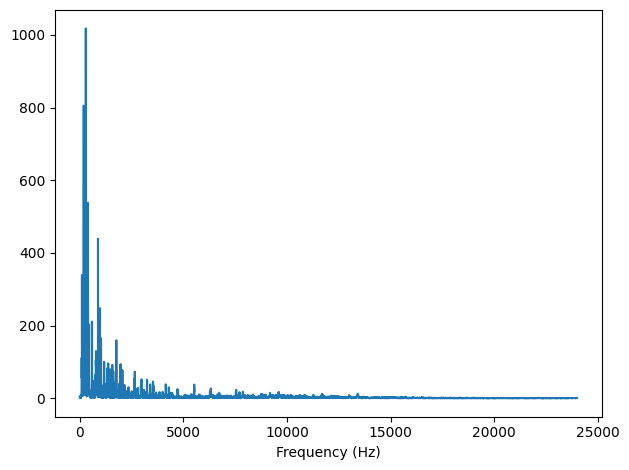

In [64]:
spectrum = segment.make_spectrum()
spectrum.plot()
decorate(xlabel='Frequency (Hz)')

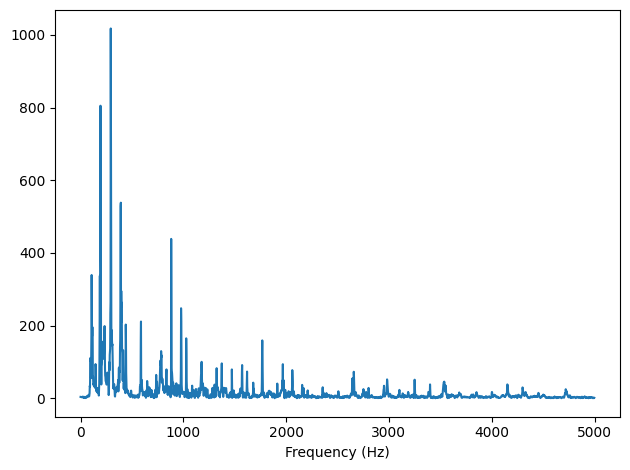

In [58]:
spectrum.plot(high=5000)
decorate(xlabel='Frequency (Hz)')

На спектре было видно большое количество частотных компонент, попробуем применить фильтр низких частот и вновь вывести спектр.

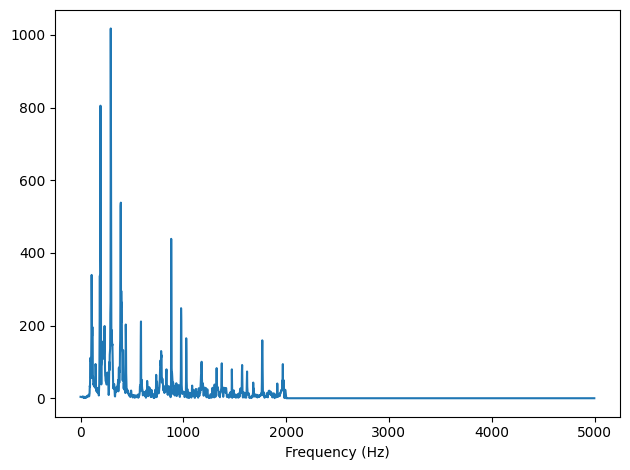

In [65]:
spectrum.low_pass(2000)
spectrum.plot(high=5000)
decorate(xlabel='Frequency (Hz)')

После применения фильтра все частотные компоненты > 2000 Гц были отрезаны. Применим фильтр высоких частот:

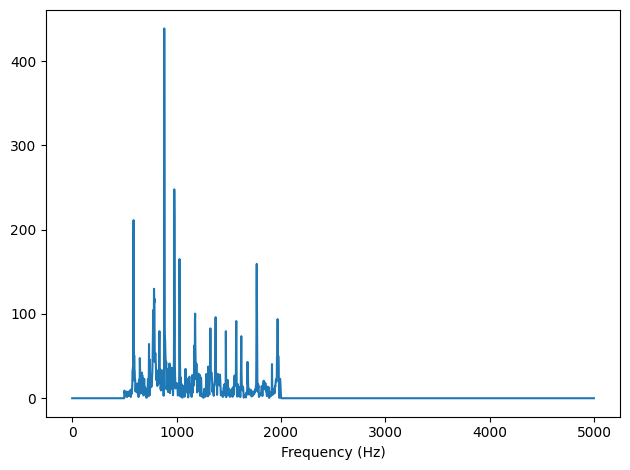

In [67]:
spectrum.high_pass(500)
spectrum.plot(high=5000)
decorate(xlabel='Frequency (Hz)')

Все частотные компоненты меньша заданной были удалены. Теперь можем сравнить полученный звук с оригиналом:

In [68]:
spectrum.make_wave().make_audio()

In [62]:
segment2 = wave.segment(0, 0.5)
segment2.make_audio()

В результате взаимодействия с фильтрами и удаления частотных компонент исследуемая запись стала звучать гораздо менее насыщенно и более приглушенно, что является ожидаемым результатом. Также по звуку можно определить, что была удалена основная частота. 

Task 1.3.

Создадим сложный сигнал из объектов CosSignal и SinSignal и прослушаем его.

In [2]:
from thinkdsp import CosSignal, SinSignal

cos_sig1 = CosSignal(freq=400, amp=1, offset=0)
sin_sig1 = SinSignal(freq=800, amp=0.5, offset=0)
cos_sig2 = CosSignal(freq=800, amp=0.25, offset=0)
sin_sig2 = SinSignal(freq=1600, amp=2, offset=0)

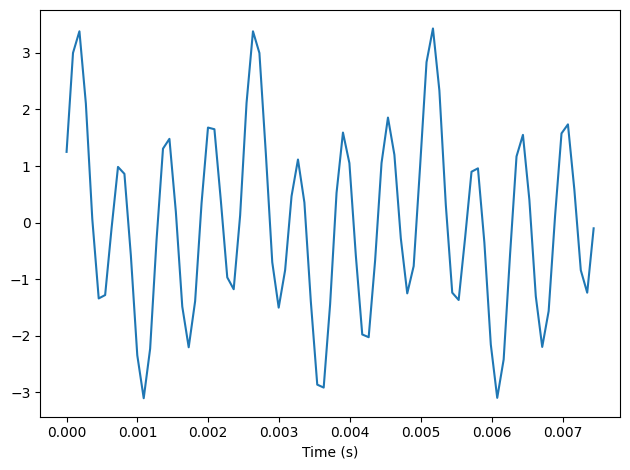

In [7]:
mix = cos_sig1 + sin_sig1 + cos_sig2 + sin_sig2
mix.plot()
decorate(xlabel='Time (s)')

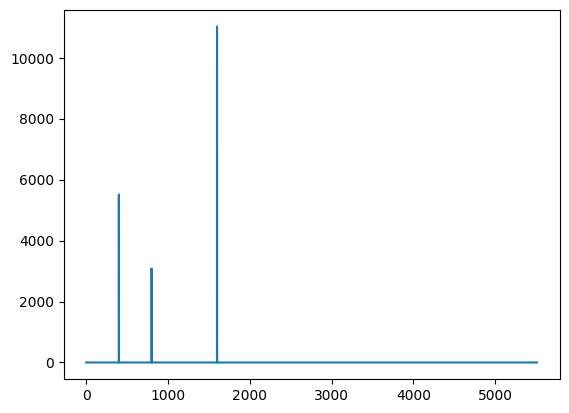

In [9]:
mix.make_wave().make_spectrum().plot()

In [128]:
mix.make_wave().make_audio()

А теперь добавим компоненту, не кратную основным.

In [12]:
mix2 = mix + CosSignal(freq=150)
mix2.make_wave().make_audio()

При прослушивании отчетливо слышен посторонний звук, напоминающий гудение. Также добавленную частотную компоненту можно заметить на спектре:

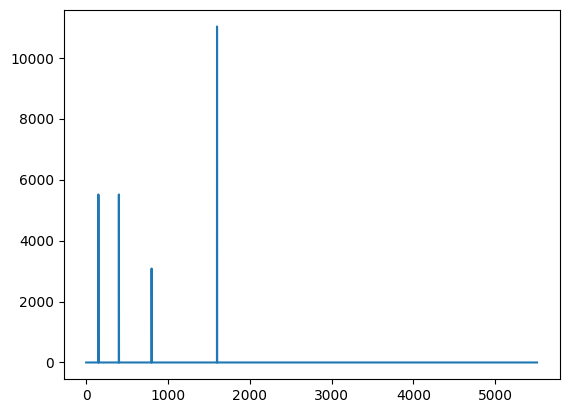

In [14]:
wave2 = mix2.make_wave()
spectrum2 = wave2.make_spectrum()
spectrum2.plot()

Task 1.4.

Попробуем ускорить и замедлить сигнал при помощи функции strethc и прослушать результаты.

In [15]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate /= factor 

In [16]:
wave3 = read_wave("170255__dublie__trumpet.wav")
wave3.make_audio()

In [142]:
stretch(wave3, 3)
wave3.make_audio()

In [17]:
stretch(wave3, 0.5)
wave3.make_audio()